## Fetal Immune - NKT  + B subset cleaning

In [22]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [23]:
import os,sys
import numpy as np 
import pandas as pd
import scanpy as sc
from datetime import datetime
import matplotlib.pyplot as plt

### Load data

In [24]:
adata_nkt = sc.read_h5ad("/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.NKT.batchCorrected.h5ad")
adata_b = sc.read_h5ad("/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.B.batchCorrected.h5ad")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


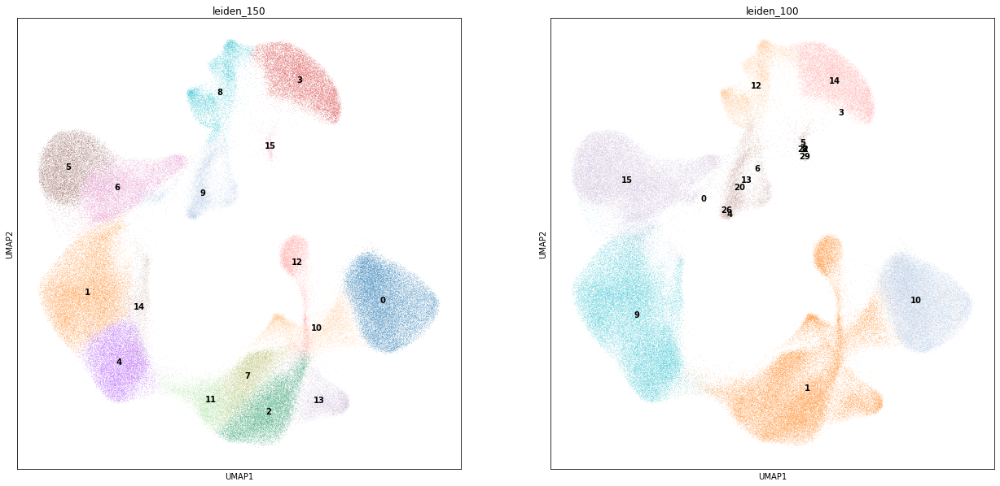

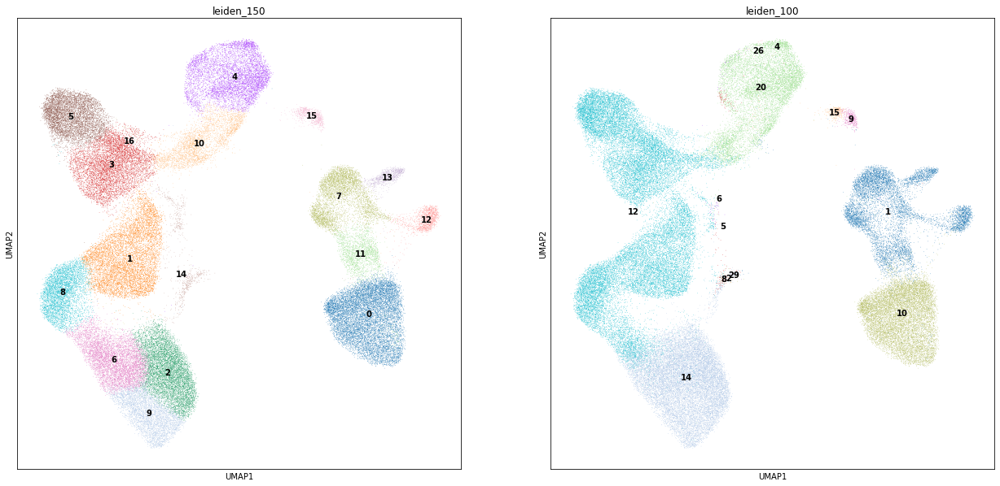

In [25]:
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.umap(adata_nkt, color=["leiden_150", "leiden_100"], legend_loc="on data")
sc.pl.umap(adata_b, color=["leiden_150", "leiden_100"], legend_loc="on data")

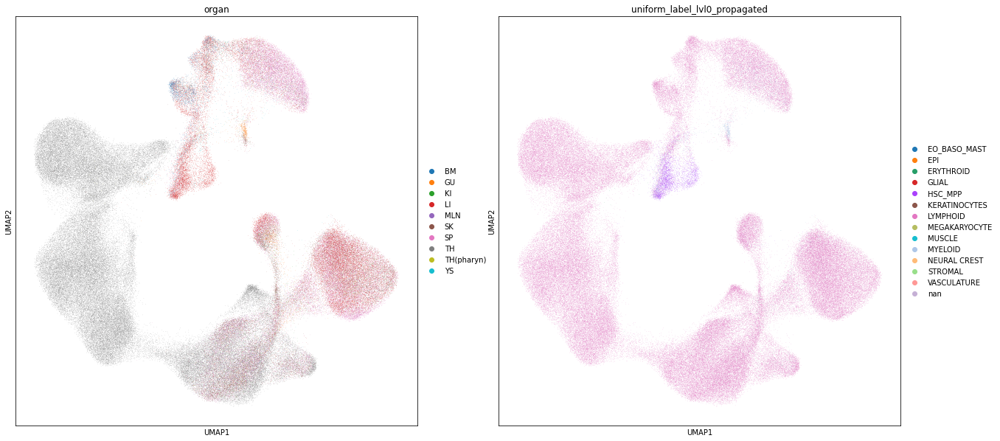

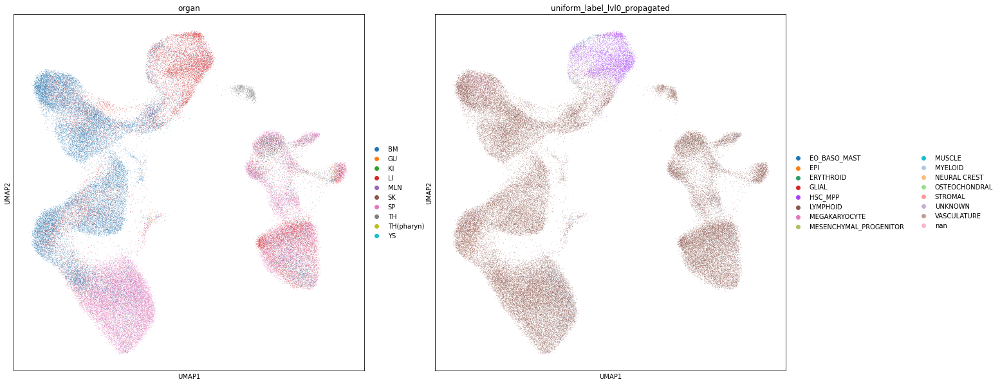

In [26]:
sc.pl.umap(adata_nkt, color=["organ", 'uniform_label_lvl0_propagated'])
sc.pl.umap(adata_b, color=["organ", 'uniform_label_lvl0_propagated'])

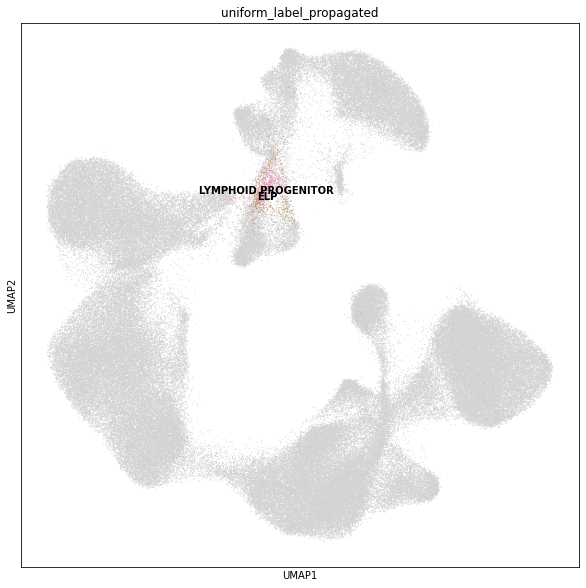

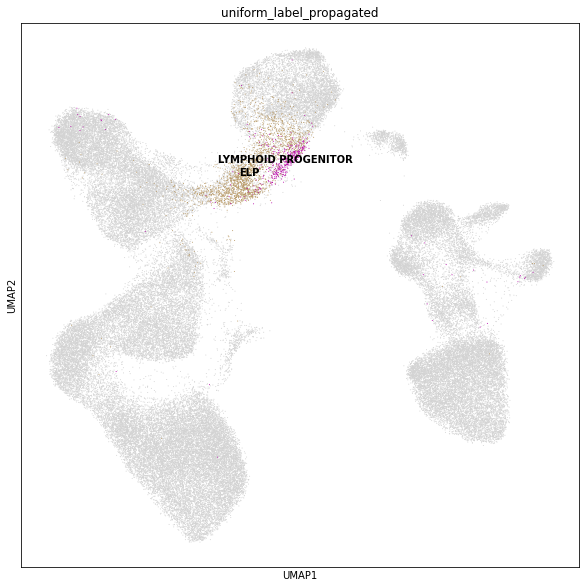

In [27]:
sc.pl.umap(adata_nkt, color=['uniform_label_propagated'], legend_loc="on data", 
               groups=["LYMPHOID PROGENITOR", "ELP"], size=4)
sc.pl.umap(adata_b, color=['uniform_label_propagated'], legend_loc="on data", 
               groups=["LYMPHOID PROGENITOR", "ELP"], size=4)

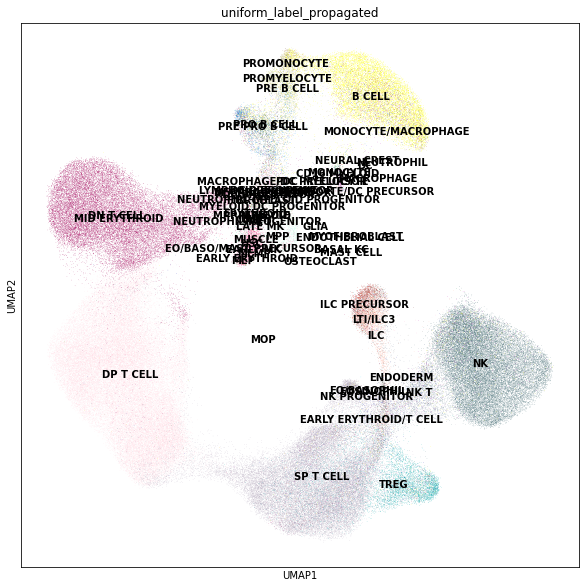

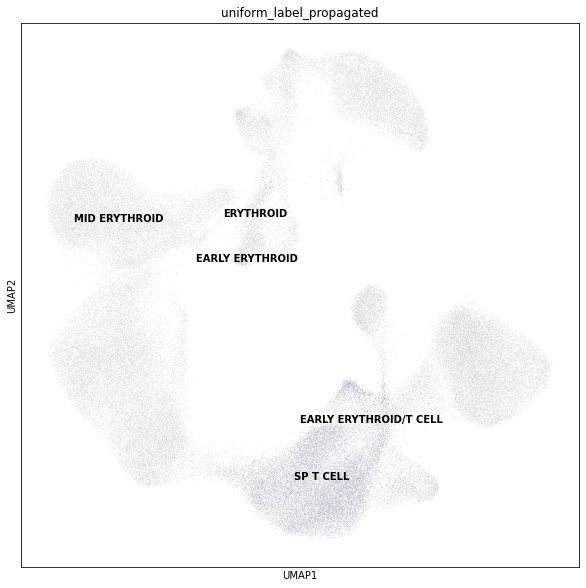

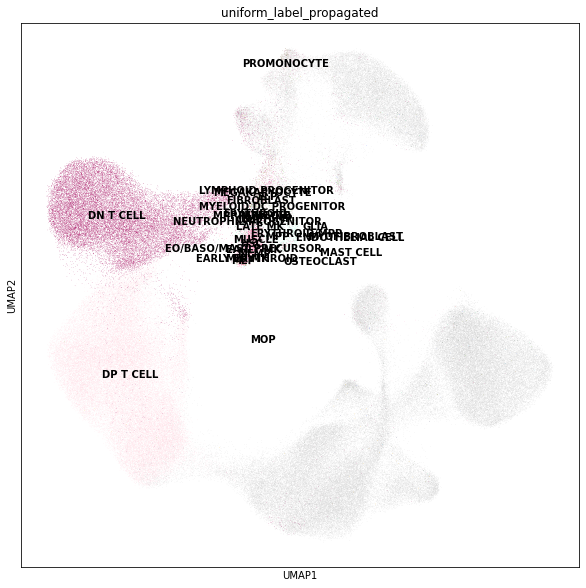

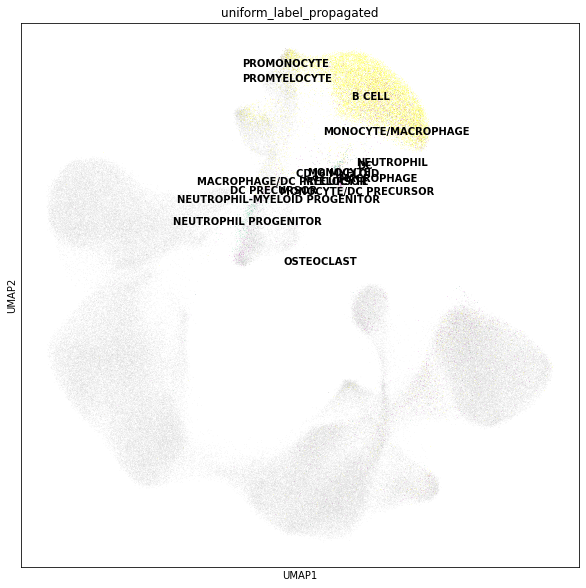

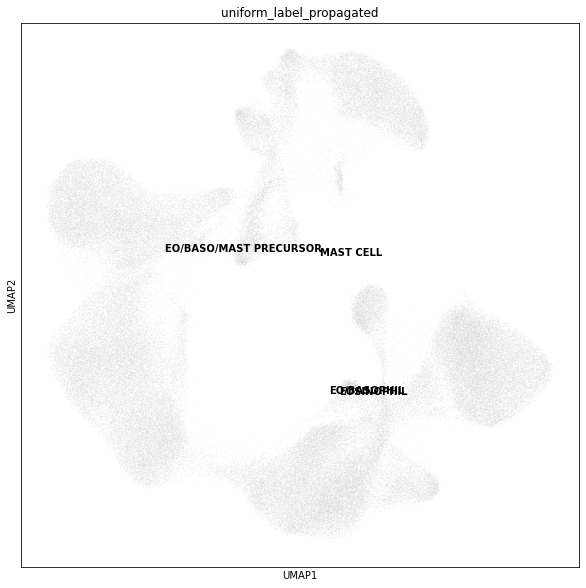

...

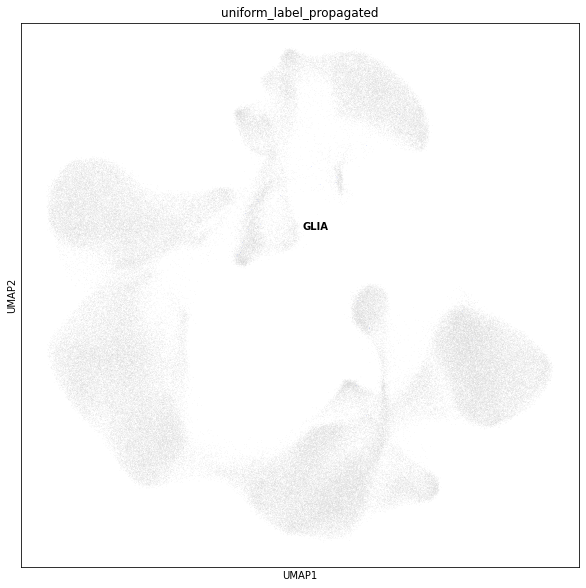

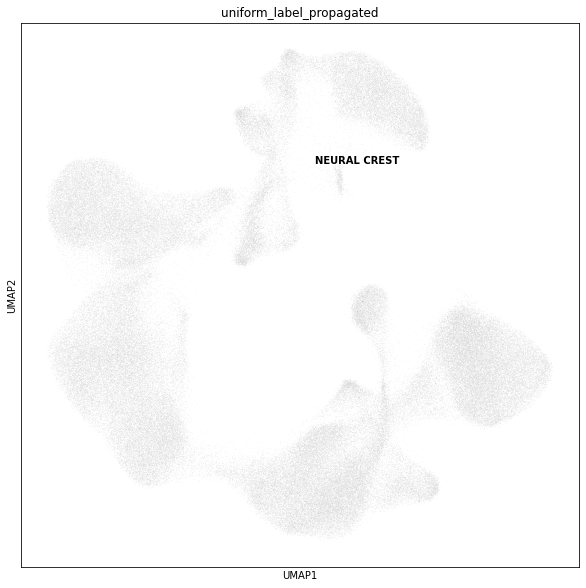

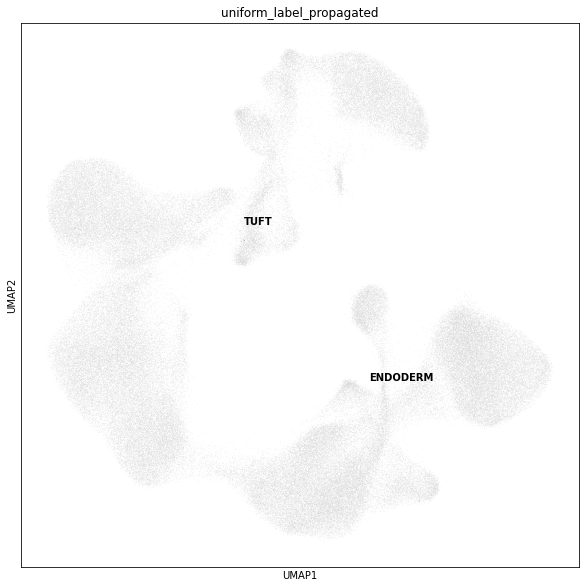

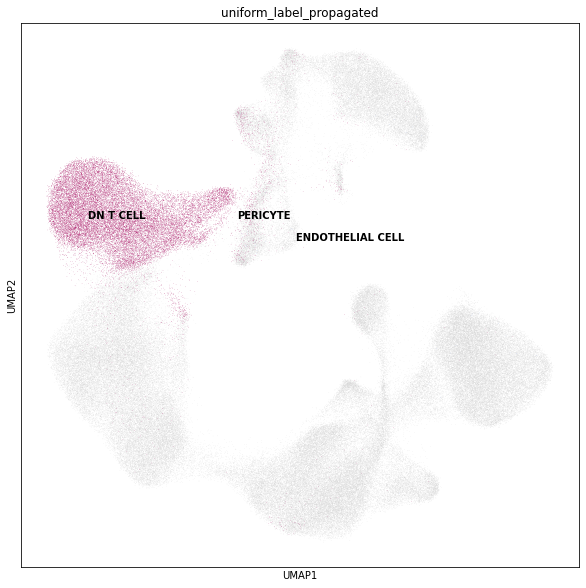

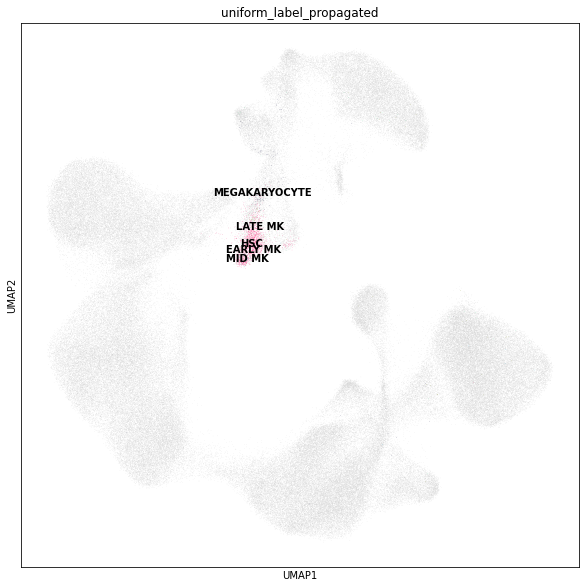

In [28]:
for o in adata_nkt.obs['uniform_label_lvl0_propagated'].unique():
    sc.pl.umap(adata_nkt, color=['uniform_label_propagated'], legend_loc="on data", 
               groups=adata_nkt.obs['uniform_label_propagated'][adata_nkt.obs['uniform_label_lvl0_propagated'] == o].unique())

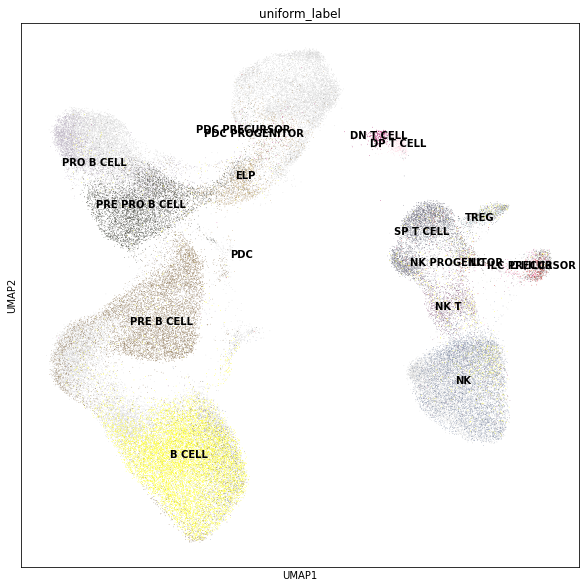

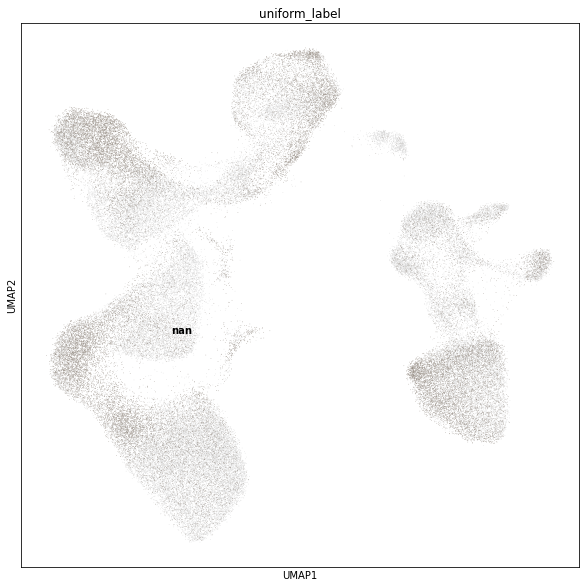

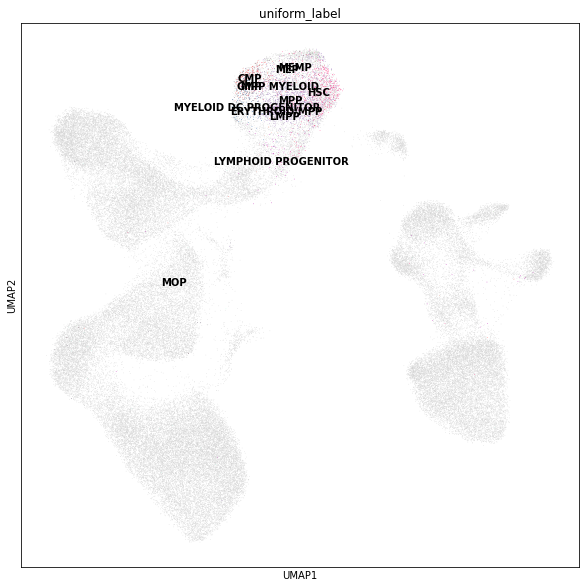

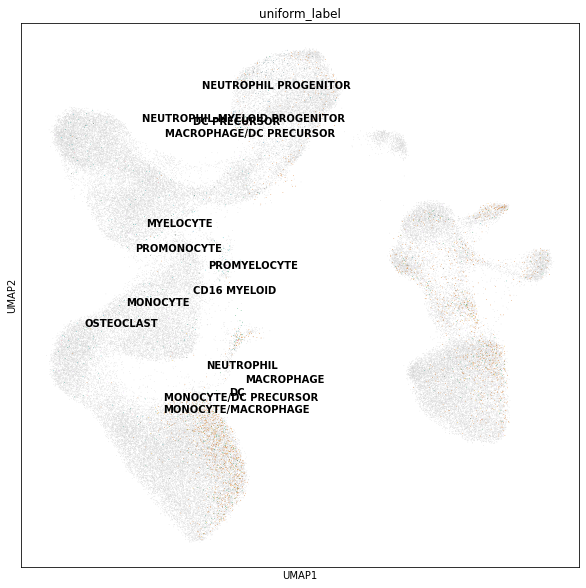

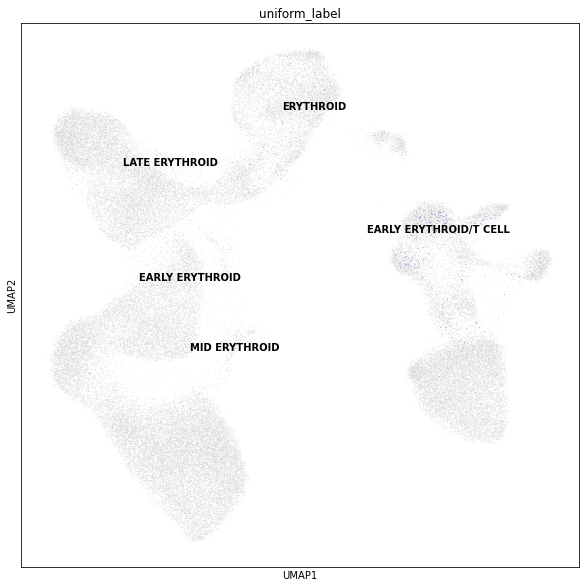

...

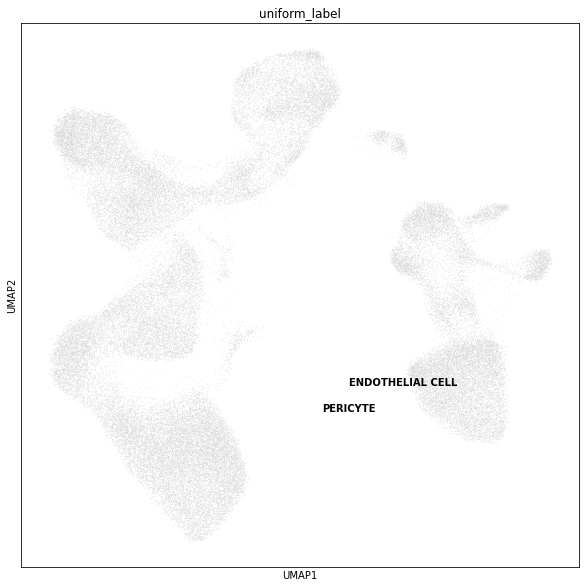

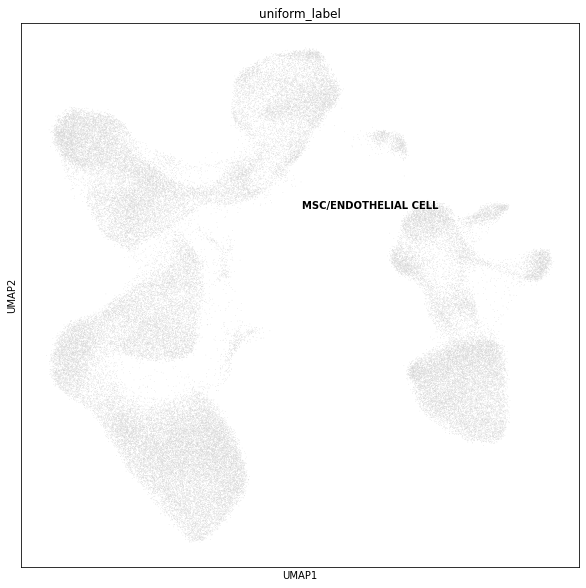

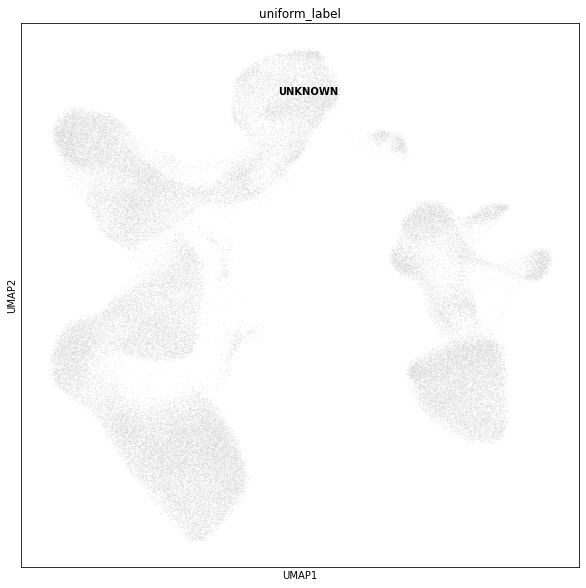

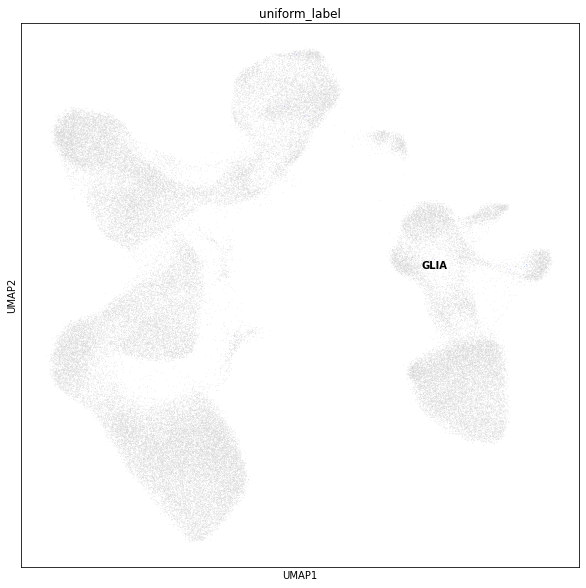

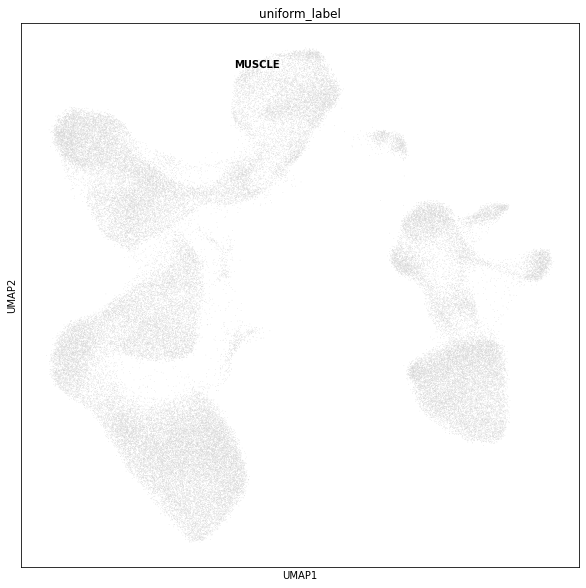

In [29]:
for o in adata_b.obs['uniform_label_lvl0'].unique():
    sc.pl.umap(adata_b, color=['uniform_label'], legend_loc="on data", 
               groups=adata_b.obs['uniform_label'][adata_b.obs['uniform_label_lvl0'] == o].unique())

### Annotate clusters using most frequent label 

In [30]:
## Add predicted label based on most frequent cell type
def _cluster2label(adata):
    cl_counts = adata.obs.reset_index()[['uniform_label_expanded_merged_propagated', 'leiden_150','index']] \
        .dropna() \
        .groupby(['leiden_150', 'uniform_label_expanded_merged_propagated']) \
        .count().fillna(0).reset_index() \
        .pivot(columns=['leiden_150'], index=['uniform_label_expanded_merged_propagated'])

    cl_frac = (cl_counts/cl_counts.sum(0))
    cl_frac.columns = ['index_' + str(x[1]) for x in cl_frac.columns]
    max_cl = cl_frac.max()
    top_3_ls = []
    for cl in cl_frac.columns:
        top_3 = cl_frac[cl_frac.index!="nan"].nlargest(1, cl)[cl].index[0]
        top_3_ls.append(top_3)

    pred_labels_df = pd.DataFrame(top_3_ls, columns=['leiden_150_pred_label'], index=[int(x.split("index_")[1]) for x in cl_frac.columns])

    pred_labels_df.index = pred_labels_df.index.astype('str')
    # pred_labels_df.loc[adata.obs['leiden_100']]['leiden_100_pred_label']

    adata.obs['leiden_150_pred_label'] = pred_labels_df.loc[adata.obs['leiden_150']]['leiden_150_pred_label'].values

In [31]:
_cluster2label(adata_nkt)
_cluster2label(adata_b)

... storing 'leiden_150_pred_label' as categorical


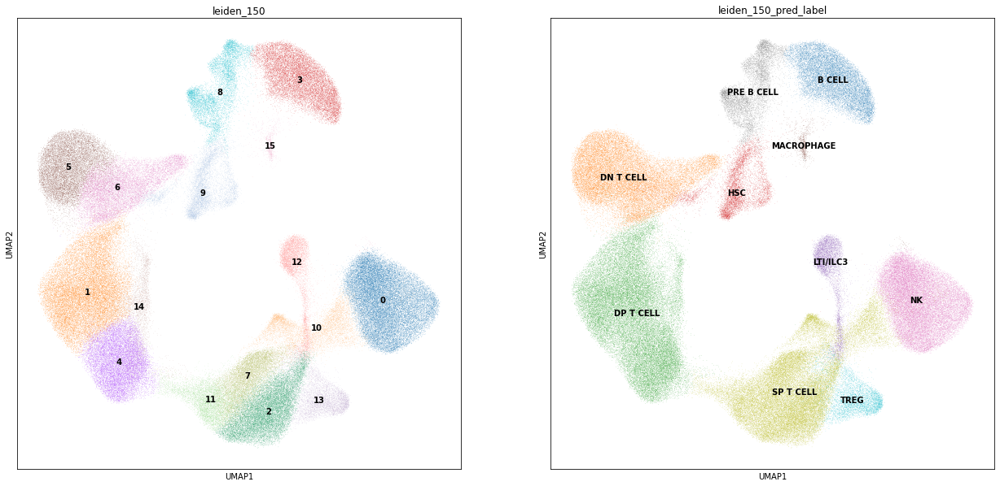

... storing 'leiden_150_pred_label' as categorical


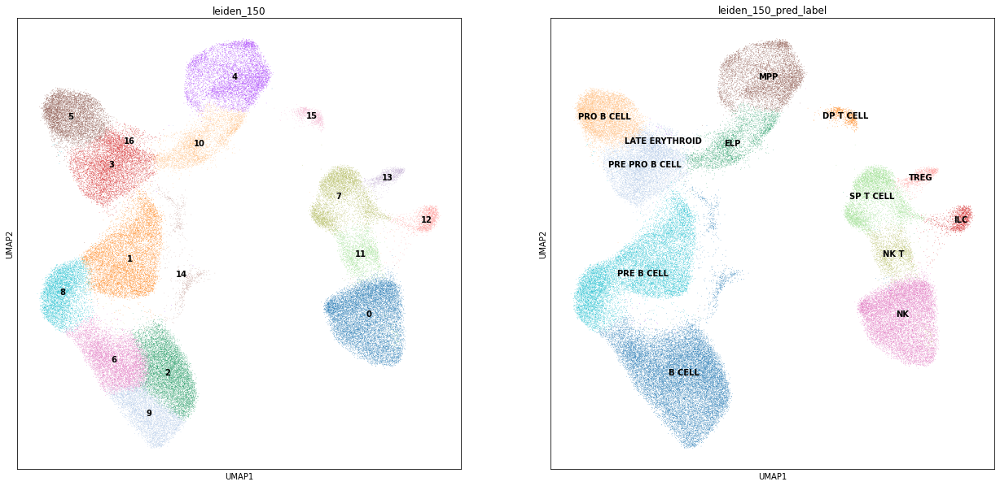

In [32]:
sc.pl.umap(adata_nkt, color=["leiden_150", "leiden_150_pred_label"], legend_loc="on data")
sc.pl.umap(adata_b, color=["leiden_150", "leiden_150_pred_label"], legend_loc="on data")

## Move 'spill-over' clusters

In [33]:
spill_over_nkt = [ "B CELL", "PRE B CELL", "PRO B CELL", "MACROPHAGE"]
spill_over_b = ["DP T CELL", "SP T CELL", "NK", "TREG", "ILC", "NK T"]

obs_keep_nkt = adata_nkt.obs_names[~adata_nkt.obs["leiden_150_pred_label"].isin(spill_over_nkt)]
obs_add_nkt = adata_b.obs_names[adata_b.obs["leiden_150_pred_label"].isin(spill_over_b)]

spill_over_nkt = [ "B CELL", "PRE B CELL", "PRO B CELL"]
obs_keep_b = adata_b.obs_names[~adata_b.obs["leiden_150_pred_label"].isin(spill_over_b)]
obs_add_b = adata_nkt.obs_names[adata_nkt.obs["leiden_150_pred_label"].isin(spill_over_nkt)]

In [34]:
adata_raw = sc.read_h5ad('/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.LYMPHOID.h5ad')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [35]:
save_path = '/nfs/team205/ed6/data/Fetal_immune/'
suffix = 'PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118'

In [36]:
s = "NKT_CLEAN"
adata_name = save_path + "{}.{}.h5ad".format(suffix, s)
sdata = adata_raw[obs_keep_nkt.append(obs_add_nkt[~obs_add_nkt.isin(obs_keep_nkt)])]

print("Saving {} anndata ({} cells, {} organs)".format(s, sdata.obs_names.shape[0], sdata.obs["organ"].unique().shape[0]))
sdata.write_h5ad(adata_name)

Saving NKT_CLEAN anndata (172157 cells, 10 organs)


In [37]:
s = "B_CLEAN"
adata_name = save_path + "{}.{}.h5ad".format(suffix, s)
sdata = adata_raw[obs_keep_b.append(obs_add_b[~obs_add_b.isin(obs_keep_b)])]

print("Saving {} anndata ({} cells, {} organs)".format(s, sdata.obs_names.shape[0], sdata.obs["organ"].unique().shape[0]))
sdata.write_h5ad(adata_name)

Saving B_CLEAN anndata (74359 cells, 10 organs)


---

### Load old object from JP

In [49]:
adata_jp = sc.read_h5ad('/nfs/team205/ed6/data/Fetal_immune/Pan_fetal/JP_archive/18_Pan_fetal/write/PAN.A03.v01.lym_B_2005190300.h5ad')

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/compat/__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/compat/__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [50]:
adata_jp.obs_names

Index(['FCAImmP7862085-GGAAAGCTCACCACCT', 'FCAImmP7579226-ATAAGAGTCGTCACGG',
       'FCAImmP7555857-CAGTCCTCACTACAGT', 'FCAImmP7528295-AAACGGGAGCAGACTG',
       'FCAImmP7555856-TTGCCGTTCATATCGG', 'FCAImmP7579226-CTCCTAGTCGGCGCTA',
       'FCAImmP7579226-CTAAGACCAGCAGTTT', 'FCAImmP7862084-CTACCCACAGGTGGAT',
       'FCAImmP7579226-ACAGCTACATGCCCGA', 'FCAImmP7579226-CGGCTAGGTAGCACGA',
       ...
       'FCAImmP7862088-TCACGAAAGTCATGCT', 'FCAImmP7862088-CTCGTCACATTGCGGC',
       'FCAImmP7862089-TACCTTAGTCATCGGC', 'FCAImmP7862088-CCTCAGTCATTGTGCA',
       'FCAImmP7862090-ATAAGAGTCTTCTGGC', 'FCAImmP7862089-GCAAACTTCCTACAGA',
       'FCAImmP7862089-CATCAGACAGCTGTTA', 'FCAImmP7862088-GGTGCGTAGAACTGTA',
       'FCAImmP7862089-GCAGTTAAGATAGCAT', 'FCAImmP7862088-TGAGCCGGTAGGGACT'],
      dtype='object', length=45861)

In [94]:
adata_jp.obs['in_v2'] = adata_jp.obs_names.isin(sdata_pp_bbknn.obs_names)

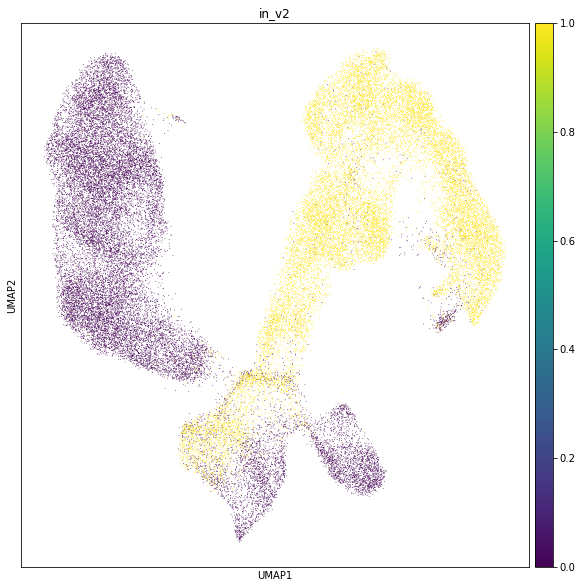

In [95]:
sc.pl.umap(adata_jp, color="in_v2")

In [51]:
adata_jp

AnnData object with n_obs × n_vars = 45861 × 3620
    obs: 'Sample', 'n_counts', 'n_genes', 'donor', 'organ', 'sort', 'method', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'batch', 'bbk', 'thy_predict', 'Cycle_score', 'isCycle', 'BM_anno', 'LI_anno', 'SP_anno', 'YS_anno', 'SK_anno', 'TH_anno.replaced.1', 'TH_anno', 'anno_all.replaced.1', 'anno_all.replaced.2', 'anno_all.replaced.3', 'anno_all.replaced.4', 'anno_all.replaced.5', 'anno_all.replaced.6', 'anno_all', 'leiden', 'leiden_0.05', 'leiden_0.10', 'leiden_0.20', 'leiden_0.50', 'leiden_1.00', 'leiden_5.00', 'leiden_10.00', 'anno_doublet_4_scores', 'anno_doublet_5_scores', 'anno_doublet_6_scores', 'anno_doublet_7_scores', 'anno_doublet_8_scores', 'anno_doublet_T_scores', 'leiden_0.20_update', 'anno_doublet_2_scores', 'anno_doublet_17_scores', 'anno_doublet_1_scores', 'anno_doublet_10_scores', 'anno_doublet_14_scores', 'anno_doublet_11_scores', 'anno_doublet_3_scores', 'anno_doublet_9_scores', 'anno_doublet_13_scor